## Preprocessing functions

In [2]:
import librosa  
import librosa.display
import IPython.display as lpd # Listening the audio
import matplotlib.pyplot as plt # Plotting 
import numpy as np
import scipy

In [3]:
def extract_features(audio_file_path, n_mels=80, resolution="Mid" , context=8, debug=False):
    """ 
        - Extract features from a song and reshape data to feed a model.
        
        Parameters:
        - audio_file_path: path to the song
        - n_mels: number of Mel filters
        - resolution: For subsampling the song. Can be 'Low' = over 12 adjacent samples, 'Mid' = over 6, 'High' = over 3
        - context: Size of context in seconds
        - debug: Enable/Disable debug verbose
        
        
        Output:
        test_x: Input data in shape (n_frames, n_frames_context, n_mels, 1)
        n_subsampling_frames: Number of frames of extracted features without padding (but with subsampling)
        subsampling: Value of subsampling, is used for preprocess labels.
        
    """
    
    # Params
    N_FFT = 2048
    HOP = int(N_FFT/2) #50% Overlap
    LOW_DB = -120 # We're going to pad with low db values (zero padding)
    SR= 44100 # Sample rate of songs
    # Extract signal from song
    signal, sr = librosa.load(audio_file_path, sr=SR)

   
    # Get features
    mel_spectrogram = librosa.feature.melspectrogram(
        y=signal,
        sr=sr,
        n_fft=N_FFT,
        hop_length=HOP,
        n_mels=n_mels,
        )
   
    n_frames_features = mel_spectrogram.shape[1]
    
    # Spectrogram Processing
    mel_spectrogram = librosa.power_to_db(mel_spectrogram) # 1. Transform to log-scale
    mel_spectrogram = mel_spectrogram - np.max(mel_spectrogram) # 2. Normalize spectrogram to 0dB
    
    # 3. Subsampling Spectrogram
    if resolution == "Low":
        subsampling = 12
    elif resolution == "Mid":
        subsampling = 6
    elif resolution == "High":
        subsampling = 3
    else:
        print("Error, wrong value for resolution. Taking 'Mid' resolution")
        subsampling = 6
    
    if n_frames_features % subsampling == 0:
        n_subsampling_frames = int(n_frames_features/subsampling)
    else:
        n_subsampling_frames = int(n_frames_features/subsampling) + 1
    
    # Create array of size (n_features, n_subsampling_frames) for the subsampled spectrogram
    subsampled_spectrogram = np.zeros((n_mels, n_subsampling_frames))
    
    for i in range(n_subsampling_frames):
        slice = mel_spectrogram[:, i*subsampling:i*subsampling + subsampling - 1]
        max = np.amax(slice, axis=1)
        subsampled_spectrogram[:,i] = max
    
    #4. Padding Spectrogram
    n_frames_context = librosa.time_to_frames(
        context,
        sr=sr, hop_length=HOP, n_fft=N_FFT
        )
    n_frames_context = int(n_frames_context/subsampling) #Adjust number of frames to our fps

    if n_frames_context % 2 != 0: # Try to make an even number of context frames
        n_frames_context += 1
    
    padded_spectrogram = np.hstack((
        np.ones((n_mels, int(n_frames_context/2))) * LOW_DB,
        subsampled_spectrogram,
        np.ones((n_mels, int(n_frames_context/2))) * LOW_DB
        ))
    
    # We need to reshape input as (n_frames, n_features)
    padded_spectrogram = padded_spectrogram.T
    
    # Create Samples to feed the network from spectrogram excerpts
    test_x = np.zeros((n_subsampling_frames,n_frames_context,n_mels))
    
    for i in range(n_subsampling_frames):
        test_x[i,:,:] = padded_spectrogram[i:i+n_frames_context, :]
        
    test_x = test_x[..., np.newaxis] # Convert to 3D dimension ( window, n_features, 1) to proper Conv2D
    
    if debug:
        print(f"Original signal shape: {signal.shape} \n")
        print(f"Mel Spectrogram Shape: {mel_spectrogram.shape} \n")
        print(f"Subsampled Mel Spectrogram Shape: {subsampled_spectrogram.shape} \n")
        print(f"Context size in frames: {n_frames_context} \n")
        print(f"Padded Spectrogram (reshaped) : {padded_spectrogram.shape} \n")
        print(f"Final Shape of our X data : {test_x.shape} \n")
        
    
    return test_x, n_subsampling_frames, subsampling


In [18]:
def preprocess_labels(labels_file_path, n_frames, subsampling, smear=10, debug=False):
        """
            - Preprocess labels from an .txt file in an output of shape (n_slices, 1) or (n_slices, n_tags) if one hot is true.
            
            Parameters:
            - labels_file_path: Path to the txt file
            - n_subsampling_frames : number of frames of extracted features
            - subsampling: subsampling value
            
            Output:
            -y_lables: Output data to feed the model without target smearing, positive values are just the exact frames of events anotated on labels file.
            -y_smear: Output data with target smearing
        """
        N_FFT = 2048
        HOP = int(N_FFT/2) #50% Overlap
        labels_list = []
        
        with open(labels_file_path, "r") as file:
            for line in file:
                s = line.strip().split(" ") # Get the pair of keys-values which are separated on the txt file by a blank
                labels_list.append(round(int(s[1])/(HOP*subsampling))) # Add to list frames value of events
             
        # Create y array (without target smearing)
        y_labels = np.zeros((n_frames,1)) # Initially filled  with zeros
        
        for frame in range(y_labels.shape[0]):
            if frame in labels_list:
                y_labels[frame,:] = 1
        
        # Target Smearing
        BOUNDARY_KERNEL = scipy.signal.gaussian(smear, std=5)
        
        # Convolve gaussian kernel with y_labels
        y_smear = np.zeros((n_frames_extracted_features,1)) # New y array for outputting both arrays
        y_smear[:,0] = np.convolve( y_labels[:,0], BOUNDARY_KERNEL, 'same')
        y_smear[:,0] = np.minimum(y_smear[:,0],1.0) # nothing above 1
        
        if debug:
            print(f"Y labels shape: {y_labels.shape} \n")
            neg, pos = np.bincount(y_labels[:,0].astype("int"))
            total = neg + pos
            print('Positive labels without Target smearing: \n Total: {}\n    Positive: {} ({:.2f}% of total)\n'.format(
                    total, pos, 100 * pos / total))
            y_labels_cont = [1 for label in y_smear if label > 0]
            pos = len(y_labels_cont) 
            print('Positive labels with Target smearing: \n Total: {}\n    Positive: {} ({:.2f}% of total)\n'.format(
                    total, pos, 100 * pos / total))
        
        return y_labels, y_smear
            

## Example in a single song

In [4]:
audio_path = "../Data/Audio/Train/08.  Imagine Dragons  -  Bad Liar.mp3"
txt_path = "../Data/Tags/Train/08.  Imagine Dragons  -  Bad Liar.txt"

In [32]:
lpd.Audio(audio_path)

In [5]:
test_x, n_frames_extracted_features, subsampling = extract_features(audio_path, n_mels=80, resolution="Mid" , context=16, debug=True)
y_labels, test_y = preprocess_labels(txt_path, n_frames_extracted_features, subsampling, smear=10, debug=True)

D:\DAVID\anaconda3\envs\python-gpu\lib\site-packages\librosa\core\audio.py:162: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn("PySoundFile failed. Trying audioread instead.")


Original signal shape: (11501568,) 

Mel Spectrogram Shape: (80, 11233) 

Subsampled Mel Spectrogram Shape: (80, 1873) 

Context size in frames: 114 

Padded Spectrogram (reshaped) : (1987, 80) 

Final Shape of our X data : (1873, 114, 80, 1) 



NameError: name 'preprocess_labels' is not defined

In [6]:
test_x.shape, test_y.shape

NameError: name 'test_y' is not defined

ValueError: too many values to unpack (expected 2)

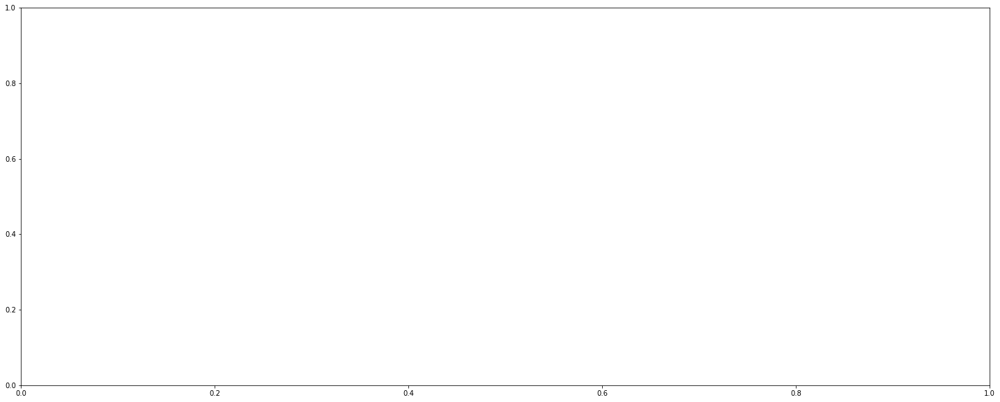

In [9]:
slice = 703

plt.figure(figsize=(25,10))  
librosa.display.specshow(test_x[:,:,:,0].T, x_axis="time",y_axis="mel", sr=44100, hop_length=1024) 
plt.colorbar(format="%+2f") 
#plt.title(f'y ={test_y[slice,:]}')
plt.show()

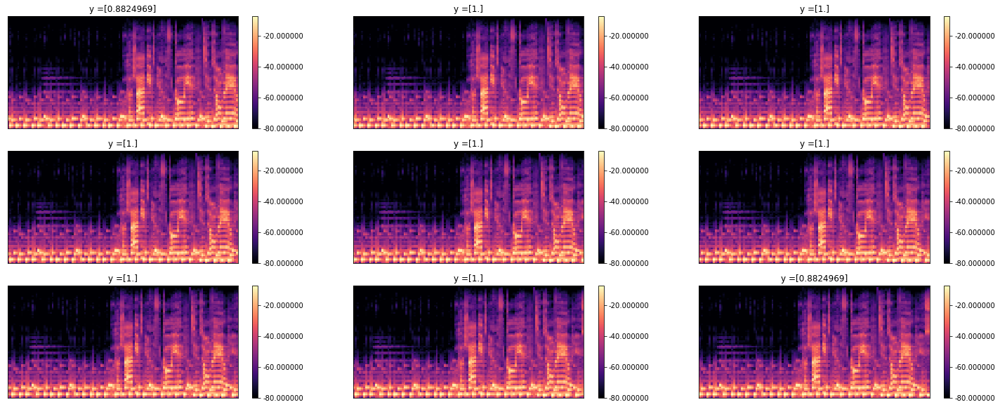

In [36]:
fig = plt.figure(figsize=(25,10))  
columns = 3
rows = 3
for i in range(1, columns*rows + 1):
    plt.subplot(rows,columns,i, ymargin=20)
    img = test_x[i+115,:,:,0].T
    librosa.display.specshow(img, sr=44100, hop_length=1024)
    plt.colorbar(format="%+2f")
    plt.title(f'y ={test_y[i+115,:]}')
plt.show()

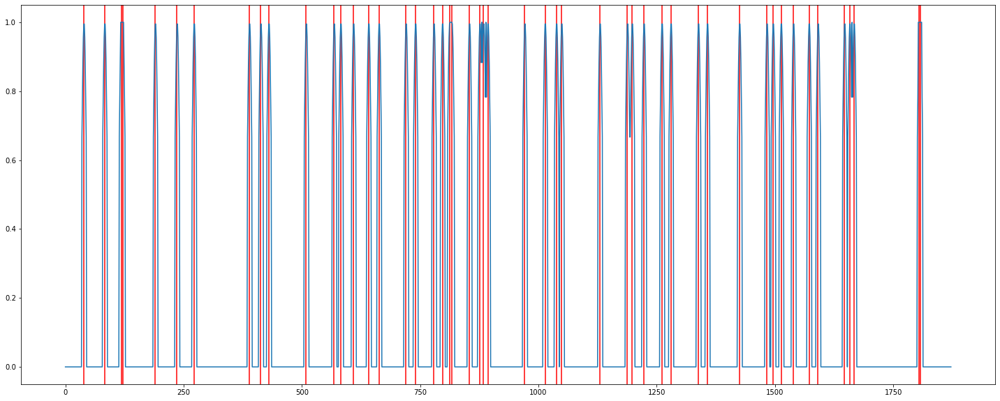

In [37]:
y_labels_index = np.where(y_labels > 0)[0]
plt.figure(figsize=(25,10))
for index in y_labels_index:
    plt.axvline(x=index, color="r")
plt.plot(test_y)

In [38]:
for i in range(test_y.shape[0]):
    print(f"Frame {i} : {test_y[i]}")

Frame 0 : [0.]
Frame 1 : [0.]
Frame 2 : [0.]
Frame 3 : [0.]
Frame 4 : [0.]
Frame 5 : [0.]
Frame 6 : [0.]
Frame 7 : [0.]
Frame 8 : [0.]
Frame 9 : [0.]
Frame 10 : [0.]
Frame 11 : [0.]
Frame 12 : [0.]
Frame 13 : [0.]
Frame 14 : [0.]
Frame 15 : [0.]
Frame 16 : [0.]
Frame 17 : [0.]
Frame 18 : [0.]
Frame 19 : [0.]
Frame 20 : [0.]
Frame 21 : [0.]
Frame 22 : [0.]
Frame 23 : [0.]
Frame 24 : [0.]
Frame 25 : [0.]
Frame 26 : [0.]
Frame 27 : [0.]
Frame 28 : [0.]
Frame 29 : [0.]
Frame 30 : [0.]
Frame 31 : [0.]
Frame 32 : [0.]
Frame 33 : [0.]
Frame 34 : [0.]
Frame 35 : [0.66697681]
Frame 36 : [0.78270454]
Frame 37 : [0.8824969]
Frame 38 : [0.95599748]
Frame 39 : [0.99501248]
Frame 40 : [0.99501248]
Frame 41 : [0.95599748]
Frame 42 : [0.8824969]
Frame 43 : [0.78270454]
Frame 44 : [0.66697681]
Frame 45 : [0.]
Frame 46 : [0.]
Frame 47 : [0.]
Frame 48 : [0.]
Frame 49 : [0.]
Frame 50 : [0.]
Frame 51 : [0.]
Frame 52 : [0.]
Frame 53 : [0.]
Frame 54 : [0.]
Frame 55 : [0.]
Frame 56 : [0.]
Frame 57 : [0.]
Fram

Frame 1342 : [0.78270454]
Frame 1343 : [0.66697681]
Frame 1344 : [0.]
Frame 1345 : [0.]
Frame 1346 : [0.]
Frame 1347 : [0.]
Frame 1348 : [0.]
Frame 1349 : [0.]
Frame 1350 : [0.]
Frame 1351 : [0.]
Frame 1352 : [0.]
Frame 1353 : [0.66697681]
Frame 1354 : [0.78270454]
Frame 1355 : [0.8824969]
Frame 1356 : [0.95599748]
Frame 1357 : [0.99501248]
Frame 1358 : [0.99501248]
Frame 1359 : [0.95599748]
Frame 1360 : [0.8824969]
Frame 1361 : [0.78270454]
Frame 1362 : [0.66697681]
Frame 1363 : [0.]
Frame 1364 : [0.]
Frame 1365 : [0.]
Frame 1366 : [0.]
Frame 1367 : [0.]
Frame 1368 : [0.]
Frame 1369 : [0.]
Frame 1370 : [0.]
Frame 1371 : [0.]
Frame 1372 : [0.]
Frame 1373 : [0.]
Frame 1374 : [0.]
Frame 1375 : [0.]
Frame 1376 : [0.]
Frame 1377 : [0.]
Frame 1378 : [0.]
Frame 1379 : [0.]
Frame 1380 : [0.]
Frame 1381 : [0.]
Frame 1382 : [0.]
Frame 1383 : [0.]
Frame 1384 : [0.]
Frame 1385 : [0.]
Frame 1386 : [0.]
Frame 1387 : [0.]
Frame 1388 : [0.]
Frame 1389 : [0.]
Frame 1390 : [0.]
Frame 1391 : [0.]
Frame 

114

In [41]:
%save prep_functions.py 4 5 18

File `prep_functions.py` exists. Overwrite (y/[N])?  y
The following commands were written to file `prep_functions.py`:
import librosa  
import librosa.display
import IPython.display as lpd # Listening the audio
import matplotlib.pyplot as plt # Plotting 
import numpy as np
import scipy
def extract_features(audio_file_path, n_mels=80, resolution="Mid" , context=8, debug=False):
    """ 
        - Extract features from a song and reshape data to feed a model.
        
        Parameters:
        - audio_file_path: path to the song
        - n_mels: number of Mel filters
        - resolution: For subsampling the song. Can be 'Low' = over 12 adjacent samples, 'Mid' = over 6, 'High' = over 3
        - context: Size of context in seconds
        - debug: Enable/Disable debug verbose
        
        
        Output:
        test_x: Input data in shape (n_frames, n_frames_context, n_mels, 1)
        n_subsampling_frames: Number of frames of extracted features without padding (but with subsam

In [13]:
N_FFT = 2048
HOP = int(N_FFT/2) #50% Overlap
LOW_DB = -120 # We're going to pad with low db values (zero padding)
SR= 44100 # Sample rate of songs
    # Extract signal from song
signal, sr = librosa.load(audio_path, sr=SR)

   
    # Get features
mel_spectrogram = librosa.feature.melspectrogram(
    y=signal,
    sr=sr,
    n_fft=N_FFT,
    hop_length=HOP,
    n_mels=80,
    )
   
n_frames_features = mel_spectrogram.shape[1]
    
    # Spectrogram Processing
mel_spectrogram = librosa.power_to_db(mel_spectrogram) # 1. Transform to log-scale
mel_spectrogram = mel_spectrogram - np.max(mel_spectrogram) # 2. Normalize spectrogram to 0dB

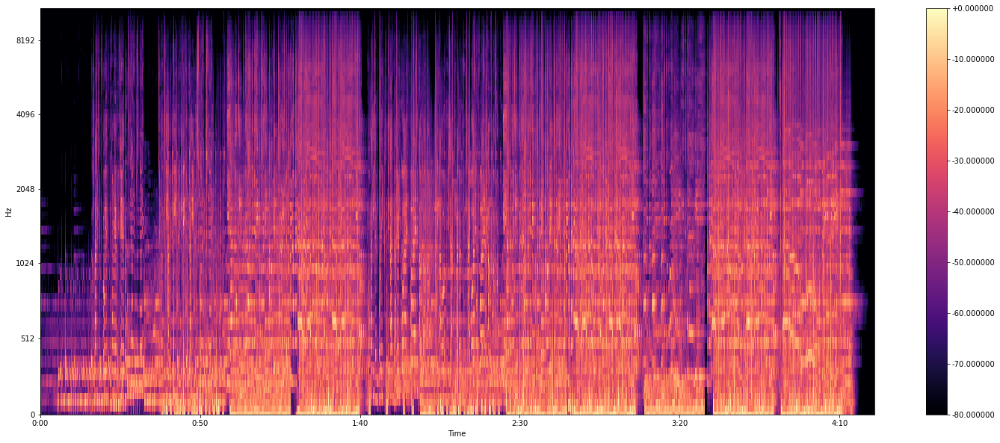

In [15]:
plt.figure(figsize=(25,10))  
librosa.display.specshow(mel_spectrogram, x_axis="time",y_axis="mel", sr=44100, hop_length=1024) 
plt.colorbar(format="%+2f") 
#plt.title(f'y ={test_y[slice,:]}')
plt.show()